# Face Detection

* Method: YOLOv8n (Nano) was chosen for its lightweight architecture, fast inference speed, and efficiency on low-resource environments.

* Data source: Loaded from [Kaggle] https://www.kaggle.com/datasets/fareselmenshawii/face-detection-dataset, no additional input file needed.

* Output file - **best.pt**: It stores the optimized weights of YOLOv8 model for later implementation in a system with emotion detection.

## Summary of Model Training Results

The model was trained for 100 epochs but stopped early at epoch 84 due to no improvement in the last 10 epochs. The total training time is approximately 10 hours with T4 GPU.
- Losses:
  - Train losses decreased consistently with no sudden spikes. This indicates both stable learning and minimal overfitting. The learning rate also changes around epoch 50 to 60 as there is a slight dip around these epochs.
  - Validation losses decreases alongside training losses, indicating that the model generalizes well.
- Evaluation metrics:
  - mAP@50 started at around 0.7 and quickly reached 0.85-0.89. It plateaued after epoch 50.
  - mAP@50-95 started at 0.45 and reached ~0.60.
  - Precision and Recall also improved consistenly throughout training.

Overall, the training was efficient, with proper convergence and no overfitting. However, the bounding box precision (~0.60) suggests there are room for improvements, potentially with a larger model, augmentation, or higher image resolution.

## Summary of Best Model's Performance

The best results are observed at epoch 74:
* Precision: 89% of detected faces were correct (low false positives)
* Recall: 82.6% of actual faces were detected (some false negatives)
* mAP@50: 0.889
* mAP@50-95: 0.597
* F1 score: 0.86. The optimal confidence threshold is around 0.35.
* Confusion matrix:
  * 8810 faces are correctly detected
  * 1489 faces were missed
  * 1429 faces were incorrectly detected

Overall, the model achieved strong detection accuracy (0.89), indicating its reliability for face detection tasks. However, bounding box precision (0.60) could be further improved with a larger model (YOLOv8s) or higher image resolution. Precision (0.89) is high but Recall (0.83) can be further improved, potentially through finetuning the confidence threshold, to help reduce false negatives.




## Requirements

In [ ]:
# Install ultralytics and other required packages
!pip install ultralytics opencv-python matplotlib


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 915.2/915.2 kB 22.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 100.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 86.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 55.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 64.4 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstal

In [ ]:
pip install kagglehub

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Import necessary libraries
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO
import os
import pandas as pd
import kagglehub

import glob
from PIL import Image

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


## Load Dataset

In [ ]:
# Download dataset from Kaggle Hub
path = kagglehub.dataset_download("fareselmenshawii/face-detection-dataset")

print("Path to dataset files:", path)

100%|██████████| 4.43G/4.43G [03:39<00:00, 21.7MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/fareselmenshawii/face-detection-dataset/versions/3


In [ ]:
# Save to local drive for tracking purposes
!mkdir -p /content/drive/MyDrive/YOLOv8_Dataset
!cp -r /root/.cache/kagglehub/datasets/fareselmenshawii/face-detection-dataset /content/drive/MyDrive/YOLOv8_Dataset/

In [ ]:
dataset_path = "/content/drive/MyDrive/YOLOv8_Dataset/face-detection-dataset"

# Print folder structure
for root, dirs, files in os.walk(dataset_path):
    print(f"📂 {root}")

📂 /content/drive/MyDrive/YOLOv8_Dataset/face-detection-dataset
📂 /content/drive/MyDrive/YOLOv8_Dataset/face-detection-dataset/versions
📂 /content/drive/MyDrive/YOLOv8_Dataset/face-detection-dataset/versions/3
📂 /content/drive/MyDrive/YOLOv8_Dataset/face-detection-dataset/versions/3/images
📂 /content/drive/MyDrive/YOLOv8_Dataset/face-detection-dataset/versions/3/images/train
📂 /content/drive/MyDrive/YOLOv8_Dataset/face-detection-dataset/versions/3/images/val
📂 /content/drive/MyDrive/YOLOv8_Dataset/face-detection-dataset/versions/3/labels
📂 /content/drive/MyDrive/YOLOv8_Dataset/face-detection-dataset/versions/3/labels/train
📂 /content/drive/MyDrive/YOLOv8_Dataset/face-detection-dataset/versions/3/labels/val
📂 /content/drive/MyDrive/YOLOv8_Dataset/face-detection-dataset/versions/3/labels2


In [ ]:
dataset_yaml_path = "/content/drive/MyDrive/YOLOv8_Dataset/dataset.yaml"

In [ ]:
yaml_content = """train: /content/drive/MyDrive/YOLOv8_Dataset/face-detection-dataset/versions/3/images/train
val: /content/drive/MyDrive/YOLOv8_Dataset/face-detection-dataset/versions/3/images/val

nc: 1  # Number of classes
names: ["face"]
"""

with open(dataset_yaml_path, "w") as f:
    f.write(yaml_content)

print(f"✅ dataset.yaml created at {dataset_yaml_path}")

✅ dataset.yaml created at /content/drive/MyDrive/YOLOv8_Dataset/dataset.yaml


In [ ]:
with open(dataset_yaml_path, "r") as f:
    print(f.read())

train: /content/drive/MyDrive/YOLOv8_Dataset/face-detection-dataset/versions/3/images/train
val: /content/drive/MyDrive/YOLOv8_Dataset/face-detection-dataset/versions/3/images/val

nc: 1  # Number of classes
names: ["face"]



In [ ]:
dataset_path = "/content/drive/MyDrive/YOLOv8_Dataset/face-detection-dataset/versions/3"

# Make sure number of images and labels for train and test are equal

train_images = os.listdir(os.path.join(dataset_path, "images/train"))
val_images = os.listdir(os.path.join(dataset_path, "images/val"))

train_labels = os.listdir(os.path.join(dataset_path, "labels/train"))
val_labels = os.listdir(os.path.join(dataset_path, "labels/val"))

print(f"📸 Train images: {len(train_images)}, 🏷️ Train labels: {len(train_labels)}")
print(f"📸 Val images: {len(val_images)}, 🏷️ Val labels: {len(val_labels)}")

📸 Train images: 13386, 🏷️ Train labels: 13386
📸 Val images: 3347, 🏷️ Val labels: 3347


## Train Face Detection Model YOLOv8

Below are our parameters seletion:
* epoch = 100: Provide sufficient training time for the model to learn. We also incorporate early stopping to make sure the model doesn't overfit.
* optimizer = AdamW: AdamW improves weight decay and leads to better generalization than standard Adam.
* patience = 10: Stop training early to prevent overfitting and reduce training time. If no improvement is observed for 10 consecutive epochs, the training stops.


In [ ]:
# Load the YOLOv8 model
model = YOLO("yolov8n.pt")  # 'n' = nano model (lightweight)


model.train(
    data=dataset_yaml_path,
    epochs=100,
    batch=32,
    imgsz=640,
    optimizer="AdamW",
    lr0=0.001,
    patience=10,
    save_period=10,
    augment=False,
    project="/content/drive/MyDrive/YOLOv8_Checkpoints",
    name="face_detection2"
)



Ultralytics 8.3.75 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/MyDrive/YOLOv8_Dataset/dataset.yaml, epochs=100, time=None, patience=10, batch=32, imgsz=640, save=True, save_period=10, cache=False, device=None, workers=8, project=/content/drive/MyDrive/YOLOv8_Checkpoints, name=face_detection2, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_c

train: Scanning /content/drive/MyDrive/YOLOv8_Dataset/face-detection-dataset/versions/3/labels/train... 13386 images, 0 backgrounds, 0 corrupt: 100%|██████████| 13386/13386 [05:26<00:00, 40.99it/s] 


train: New cache created: /content/drive/MyDrive/YOLOv8_Dataset/face-detection-dataset/versions/3/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/MyDrive/YOLOv8_Dataset/face-detection-dataset/versions/3/labels/val... 3347 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3347/3347 [01:24<00:00, 39.45it/s] 


val: New cache created: /content/drive/MyDrive/YOLOv8_Dataset/face-detection-dataset/versions/3/labels/val.cache
Plotting labels to /content/drive/MyDrive/YOLOv8_Checkpoints/face_detection2/labels.jpg... 
optimizer: AdamW(lr=0.001, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/drive/MyDrive/YOLOv8_Checkpoints/face_detection2
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      6.55G      1.403      1.172      1.198         43        640: 100%|██████████| 419/419 [06:54<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [01:10<00:00,  1.32s/it]


                   all       3347      10299      0.828      0.655      0.746      0.455

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      7.51G      1.305     0.8738      1.139         39        640: 100%|██████████| 419/419 [07:08<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [01:09<00:00,  1.30s/it]


                   all       3347      10299      0.829      0.667      0.753       0.47

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      5.55G      1.288     0.8327      1.129         70        640: 100%|██████████| 419/419 [07:04<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [01:06<00:00,  1.25s/it]


                   all       3347      10299      0.879      0.716      0.798       0.51

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      6.75G      1.278      0.819      1.123         64        640: 100%|██████████| 419/419 [07:27<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [01:02<00:00,  1.18s/it]


                   all       3347      10299       0.88      0.716      0.801      0.498

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      5.71G      1.247     0.7785      1.111         73        640: 100%|██████████| 419/419 [06:33<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [01:02<00:00,  1.19s/it]


                   all       3347      10299      0.881      0.756      0.836      0.526

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      7.18G      1.246     0.7588      1.107         76        640: 100%|██████████| 419/419 [06:35<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [01:04<00:00,  1.23s/it]


                   all       3347      10299      0.888      0.741      0.825      0.528

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      5.19G      1.226     0.7458      1.098        214        640:  46%|████▋     | 194/419 [17:30<20:18,  5.41s/it]


KeyboardInterrupt: 

In [ ]:
# Load the last saved checkpoint
checkpoint_path = "/content/drive/MyDrive/YOLOv8_Checkpoints/face_detection2/weights/last.pt"

model = YOLO(checkpoint_path)  # Load trained model

# Resume training for more epochs
model.train(
    data=dataset_yaml_path,
    epochs=100,
    batch=32,
    imgsz=640,
    optimizer="AdamW",
    lr0=0.001,
    patience=10,
    save_period=10,
    augment=False,
    project="/content/drive/MyDrive/YOLOv8_Checkpoints",
    name="face_detection2",
    resume=True
)




Ultralytics 8.3.75 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=/content/drive/MyDrive/YOLOv8_Checkpoints/face_detection2/weights/last.pt, data=/content/drive/MyDrive/YOLOv8_Dataset/dataset.yaml, epochs=100, time=None, patience=10, batch=32, imgsz=640, save=True, save_period=10, cache=False, device=None, workers=8, project=/content/drive/MyDrive/YOLOv8_Checkpoints, name=face_detection2, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=/content/drive/MyDrive/YOLOv8_Checkpoints/face_detection2/weights/last.pt, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, aug

100%|██████████| 755k/755k [00:00<00:00, 14.8MB/s]


TensorBoard: Start with 'tensorboard --logdir /content/drive/MyDrive/YOLOv8_Checkpoints/face_detection2', view at http://localhost:6006/

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.blo

100%|██████████| 5.35M/5.35M [00:00<00:00, 67.6MB/s]


AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/YOLOv8_Dataset/face-detection-dataset/versions/3/labels/train.cache... 13386 images, 0 backgrounds, 0 corrupt: 100%|██████████| 13386/13386 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/MyDrive/YOLOv8_Dataset/face-detection-dataset/versions/3/labels/val.cache... 3347 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3347/3347 [00:00<?, ?it/s]


Plotting labels to /content/drive/MyDrive/YOLOv8_Checkpoints/face_detection2/labels.jpg... 
optimizer: AdamW(lr=0.001, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Resuming training /content/drive/MyDrive/YOLOv8_Checkpoints/face_detection2/weights/last.pt from epoch 7 to 100 total epochs
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/drive/MyDrive/YOLOv8_Checkpoints/face_detection2
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      6.29G      1.227     0.7451      1.105         43        640: 100%|██████████| 419/419 [35:35<00:00,  5.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [01:05<00:00,  1.23s/it]


                   all       3347      10299      0.888      0.754      0.837      0.537

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      7.49G      1.211     0.7256      1.093         39        640: 100%|██████████| 419/419 [06:14<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:57<00:00,  1.09s/it]


                   all       3347      10299       0.88      0.742      0.835      0.547

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      5.66G      1.208     0.7106      1.089         70        640: 100%|██████████| 419/419 [06:12<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [01:00<00:00,  1.15s/it]


                   all       3347      10299      0.885      0.769      0.847      0.554

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      6.74G      1.203     0.7069      1.087         64        640: 100%|██████████| 419/419 [06:16<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:59<00:00,  1.12s/it]


                   all       3347      10299      0.888      0.766      0.846      0.545

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      5.69G      1.185      0.692       1.08         73        640: 100%|██████████| 419/419 [06:13<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [01:00<00:00,  1.14s/it]


                   all       3347      10299      0.887      0.775      0.854      0.558

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      7.16G      1.188     0.6839      1.076         76        640: 100%|██████████| 419/419 [06:11<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [01:00<00:00,  1.14s/it]


                   all       3347      10299      0.888      0.765      0.846      0.551

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      6.64G      1.188      0.679      1.077         82        640: 100%|██████████| 419/419 [38:24<00:00,  5.50s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:58<00:00,  1.11s/it]


                   all       3347      10299      0.893       0.78       0.86      0.563

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      7.05G      1.194     0.6849       1.08         24        640: 100%|██████████| 419/419 [06:07<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:59<00:00,  1.13s/it]


                   all       3347      10299      0.899      0.778      0.861      0.563

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      6.01G      1.182     0.6751      1.079         92        640: 100%|██████████| 419/419 [06:08<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:59<00:00,  1.12s/it]


                   all       3347      10299      0.888      0.791      0.864      0.569

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      6.19G      1.177     0.6679      1.076         50        640: 100%|██████████| 419/419 [06:07<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:58<00:00,  1.11s/it]


                   all       3347      10299      0.886      0.796      0.867      0.569

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      6.83G       1.18     0.6588      1.073         81        640: 100%|██████████| 419/419 [06:11<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:58<00:00,  1.10s/it]


                   all       3347      10299      0.884      0.795      0.867      0.571

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      6.33G       1.18     0.6629      1.077         51        640: 100%|██████████| 419/419 [06:10<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:59<00:00,  1.12s/it]


                   all       3347      10299       0.89      0.789      0.867      0.568

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100       6.1G      1.171     0.6535      1.069         58        640: 100%|██████████| 419/419 [06:08<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:59<00:00,  1.12s/it]


                   all       3347      10299      0.891      0.798      0.869      0.573

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      6.07G      1.169     0.6504       1.07         34        640: 100%|██████████| 419/419 [06:08<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:59<00:00,  1.13s/it]


                   all       3347      10299      0.892      0.786      0.868      0.576

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      6.02G      1.164     0.6425      1.069         50        640: 100%|██████████| 419/419 [06:06<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [01:00<00:00,  1.14s/it]


                   all       3347      10299      0.892        0.8      0.874      0.576

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      6.21G      1.163     0.6456      1.064         43        640: 100%|██████████| 419/419 [06:08<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:59<00:00,  1.12s/it]


                   all       3347      10299       0.89      0.798      0.872      0.577

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      5.37G      1.156     0.6371       1.06         45        640: 100%|██████████| 419/419 [06:05<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:59<00:00,  1.13s/it]


                   all       3347      10299      0.889      0.805      0.876      0.577

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100       5.5G      1.159     0.6382      1.063         47        640: 100%|██████████| 419/419 [06:10<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:58<00:00,  1.11s/it]


                   all       3347      10299      0.892      0.806      0.875      0.578

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      5.68G      1.154      0.629       1.06         55        640: 100%|██████████| 419/419 [06:07<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:59<00:00,  1.13s/it]


                   all       3347      10299      0.891      0.806      0.877       0.58

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      6.44G      1.154     0.6294       1.06         53        640: 100%|██████████| 419/419 [06:38<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [01:00<00:00,  1.14s/it]


                   all       3347      10299      0.895      0.803      0.879      0.584

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      7.59G      1.152     0.6239       1.06         55        640: 100%|██████████| 419/419 [06:08<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [01:01<00:00,  1.15s/it]


                   all       3347      10299      0.891      0.804      0.878      0.582

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      5.64G      1.149     0.6197      1.057         41        640: 100%|██████████| 419/419 [06:07<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:59<00:00,  1.12s/it]


                   all       3347      10299      0.892      0.801      0.878      0.583

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      5.53G      1.141      0.611       1.06         55        640: 100%|██████████| 419/419 [06:08<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:59<00:00,  1.11s/it]


                   all       3347      10299      0.894      0.807      0.881      0.585

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      5.56G      1.142     0.6125      1.054         43        640: 100%|██████████| 419/419 [06:09<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:58<00:00,  1.10s/it]


                   all       3347      10299      0.895      0.801      0.881      0.584

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      6.04G      1.142     0.6115      1.055         50        640: 100%|██████████| 419/419 [06:09<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [01:00<00:00,  1.14s/it]


                   all       3347      10299      0.897      0.811      0.883      0.586

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      5.52G      1.138     0.6045      1.052         92        640: 100%|██████████| 419/419 [06:10<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:59<00:00,  1.13s/it]


                   all       3347      10299      0.884      0.815      0.881      0.587

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      6.43G      1.144     0.6072      1.053         49        640: 100%|██████████| 419/419 [06:08<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:59<00:00,  1.13s/it]


                   all       3347      10299      0.889      0.814      0.882      0.586

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      6.39G       1.13     0.6009      1.049         56        640: 100%|██████████| 419/419 [06:09<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [01:00<00:00,  1.13s/it]


                   all       3347      10299      0.894      0.812      0.884      0.589

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      6.48G      1.135     0.5973       1.05         55        640: 100%|██████████| 419/419 [06:07<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:58<00:00,  1.10s/it]


                   all       3347      10299       0.89      0.813      0.883      0.589

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      7.16G      1.133      0.599       1.05         68        640: 100%|██████████| 419/419 [06:09<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:58<00:00,  1.10s/it]


                   all       3347      10299      0.891      0.814      0.886      0.591

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      6.62G      1.127     0.5939      1.047         89        640: 100%|██████████| 419/419 [06:07<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:59<00:00,  1.13s/it]


                   all       3347      10299      0.892       0.82      0.887      0.591

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      5.79G      1.127     0.5881       1.05         85        640: 100%|██████████| 419/419 [06:08<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [01:00<00:00,  1.14s/it]


                   all       3347      10299      0.889      0.819      0.885      0.592

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      6.09G      1.123     0.5882      1.045         43        640: 100%|██████████| 419/419 [06:09<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:59<00:00,  1.12s/it]


                   all       3347      10299       0.89      0.813      0.886      0.591

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      5.45G      1.123     0.5887      1.048         30        640: 100%|██████████| 419/419 [06:08<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [01:00<00:00,  1.14s/it]


                   all       3347      10299      0.897      0.811      0.886      0.592

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      5.86G      1.122     0.5863      1.042         88        640: 100%|██████████| 419/419 [06:06<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:57<00:00,  1.09s/it]

                   all       3347      10299      0.892      0.815      0.887      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      6.43G      1.118      0.588      1.042         34        640: 100%|██████████| 419/419 [06:05<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:59<00:00,  1.13s/it]

                   all       3347      10299      0.891       0.82      0.888      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      4.93G      1.109     0.5794      1.042        176        640:  61%|██████▏   | 257/419 [1:46:24<1:07:04, 24.84s/it]


KeyboardInterrupt: 

In [ ]:
# Load the last saved checkpoint
checkpoint_path = "/content/drive/MyDrive/YOLOv8_Checkpoints/face_detection2/weights/last.pt"

model = YOLO(checkpoint_path)  # Load trained model

# Resume training for more epochs
model.train(
    data=dataset_yaml_path,
    epochs=100,
    batch=32,
    imgsz=640,
    optimizer="AdamW",
    lr0=0.001,
    patience=10,
    save_period=10,
    augment=False,
    project="/content/drive/MyDrive/YOLOv8_Checkpoints",
    name="face_detection2",
    resume=True
)

# Validate performance on validation set
results = model.val()
print("📊 Results", results)


Ultralytics 8.3.75 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=/content/drive/MyDrive/YOLOv8_Checkpoints/face_detection2/weights/last.pt, data=/content/drive/MyDrive/YOLOv8_Dataset/dataset.yaml, epochs=100, time=None, patience=10, batch=32, imgsz=640, save=True, save_period=10, cache=False, device=None, workers=8, project=/content/drive/MyDrive/YOLOv8_Checkpoints, name=face_detection2, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=/content/drive/MyDrive/YOLOv8_Checkpoints/face_detection2/weights/last.pt, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, aug

train: Scanning /content/drive/MyDrive/YOLOv8_Dataset/face-detection-dataset/versions/3/labels/train.cache... 13386 images, 0 backgrounds, 0 corrupt: 100%|██████████| 13386/13386 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/YOLOv8_Dataset/face-detection-dataset/versions/3/labels/val.cache... 3347 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3347/3347 [00:00<?, ?it/s]


Plotting labels to /content/drive/MyDrive/YOLOv8_Checkpoints/face_detection2/labels.jpg... 
optimizer: AdamW(lr=0.001, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Resuming training /content/drive/MyDrive/YOLOv8_Checkpoints/face_detection2/weights/last.pt from epoch 48 to 100 total epochs
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/drive/MyDrive/YOLOv8_Checkpoints/face_detection2
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      6.78G       1.03     0.5155      1.009         43        640: 100%|██████████| 419/419 [06:16<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:58<00:00,  1.10s/it]


                   all       3347      10299      0.891      0.819      0.884       0.59

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      7.87G      1.051     0.5321      1.015         39        640: 100%|██████████| 419/419 [06:20<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:58<00:00,  1.11s/it]


                   all       3347      10299      0.887      0.822      0.883      0.589

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      6.04G      1.093     0.5578      1.028         70        640: 100%|██████████| 419/419 [06:24<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [01:00<00:00,  1.14s/it]

                   all       3347      10299      0.886      0.824      0.886      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      7.12G      1.112     0.5696      1.039         64        640: 100%|██████████| 419/419 [06:28<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [01:00<00:00,  1.15s/it]


                   all       3347      10299      0.888      0.823      0.886      0.592

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      6.06G      1.095     0.5623      1.031         73        640: 100%|██████████| 419/419 [06:26<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [01:00<00:00,  1.13s/it]


                   all       3347      10299      0.889      0.822      0.887      0.593

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      7.54G      1.108     0.5604      1.034         76        640: 100%|██████████| 419/419 [06:24<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [01:01<00:00,  1.17s/it]


                   all       3347      10299      0.891      0.824      0.888      0.593

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      7.01G      1.097     0.5538      1.031         82        640: 100%|██████████| 419/419 [06:21<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [01:01<00:00,  1.16s/it]


                   all       3347      10299      0.894      0.823      0.888      0.594

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      7.43G      1.105     0.5621      1.033         24        640: 100%|██████████| 419/419 [06:22<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:58<00:00,  1.10s/it]


                   all       3347      10299      0.893      0.822      0.887      0.594

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      6.39G      1.093     0.5535      1.034         92        640: 100%|██████████| 419/419 [06:23<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [01:00<00:00,  1.14s/it]


                   all       3347      10299      0.894      0.819      0.888      0.595

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      6.57G      1.091     0.5531       1.03         50        640: 100%|██████████| 419/419 [06:21<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:59<00:00,  1.13s/it]


                   all       3347      10299      0.892      0.822      0.889      0.595

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100       7.2G      1.096      0.547      1.031         81        640: 100%|██████████| 419/419 [06:15<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:59<00:00,  1.13s/it]


                   all       3347      10299      0.892      0.822      0.889      0.595

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      6.71G      1.094     0.5494      1.033         51        640: 100%|██████████| 419/419 [06:20<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:58<00:00,  1.11s/it]


                   all       3347      10299       0.89      0.822      0.888      0.595

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      6.47G       1.09      0.546      1.028         58        640: 100%|██████████| 419/419 [06:24<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [01:00<00:00,  1.15s/it]


                   all       3347      10299       0.89      0.823      0.888      0.595

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      6.45G      1.089     0.5455       1.03         34        640: 100%|██████████| 419/419 [06:22<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [01:02<00:00,  1.17s/it]


                   all       3347      10299      0.894      0.819      0.889      0.595

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      6.39G      1.083     0.5394       1.03         50        640: 100%|██████████| 419/419 [06:21<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:59<00:00,  1.12s/it]


                   all       3347      10299      0.889      0.823      0.888      0.596

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      6.59G      1.087     0.5431      1.027         43        640: 100%|██████████| 419/419 [06:19<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [01:01<00:00,  1.15s/it]


                   all       3347      10299      0.892      0.823      0.889      0.596

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      5.75G      1.081     0.5383      1.026         45        640: 100%|██████████| 419/419 [06:24<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [01:00<00:00,  1.14s/it]


                   all       3347      10299      0.892      0.822      0.889      0.596

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      5.88G      1.081     0.5354      1.029         47        640: 100%|██████████| 419/419 [06:25<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:59<00:00,  1.12s/it]


                   all       3347      10299      0.891      0.822      0.888      0.595

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      6.05G      1.076     0.5315      1.021         55        640: 100%|██████████| 419/419 [06:26<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:58<00:00,  1.11s/it]


                   all       3347      10299      0.891      0.822      0.888      0.596

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      6.82G      1.077     0.5321      1.022         53        640: 100%|██████████| 419/419 [06:19<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [01:01<00:00,  1.15s/it]


                   all       3347      10299      0.891      0.823      0.888      0.596

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      7.96G      1.079     0.5294      1.023         55        640: 100%|██████████| 419/419 [06:14<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:59<00:00,  1.13s/it]


                   all       3347      10299      0.893      0.822      0.889      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      6.03G      1.074     0.5266      1.018         41        640: 100%|██████████| 419/419 [06:18<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:57<00:00,  1.08s/it]

                   all       3347      10299      0.891      0.823      0.889      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      5.91G      1.069     0.5228      1.021         55        640: 100%|██████████| 419/419 [06:27<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [01:01<00:00,  1.15s/it]


                   all       3347      10299      0.892      0.824      0.889      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      5.94G      1.073     0.5234      1.018         43        640: 100%|██████████| 419/419 [06:25<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [01:01<00:00,  1.17s/it]


                   all       3347      10299      0.894      0.822      0.889      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      6.41G      1.072     0.5229      1.018         50        640: 100%|██████████| 419/419 [06:22<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:58<00:00,  1.11s/it]


                   all       3347      10299      0.892      0.824      0.889      0.596

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      5.91G      1.068     0.5174      1.017         92        640: 100%|██████████| 419/419 [06:28<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:59<00:00,  1.12s/it]


                   all       3347      10299      0.891      0.825      0.889      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100       6.8G      1.072     0.5212      1.018         49        640: 100%|██████████| 419/419 [06:25<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:57<00:00,  1.09s/it]


                   all       3347      10299       0.89      0.827      0.889      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      6.77G      1.062     0.5159      1.014         56        640: 100%|██████████| 419/419 [06:19<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:59<00:00,  1.13s/it]

                   all       3347      10299      0.889      0.826      0.889      0.597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      6.86G      1.065     0.5134      1.015         55        640: 100%|██████████| 419/419 [06:21<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [01:00<00:00,  1.14s/it]


                   all       3347      10299      0.888      0.827      0.889      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      7.54G      1.062     0.5156      1.016         68        640: 100%|██████████| 419/419 [06:55<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:59<00:00,  1.13s/it]


                   all       3347      10299      0.889      0.827      0.889      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100         7G      1.057     0.5112      1.013         89        640: 100%|██████████| 419/419 [06:20<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:59<00:00,  1.12s/it]


                   all       3347      10299      0.887      0.829       0.89      0.596

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      6.17G      1.057     0.5081      1.017         85        640: 100%|██████████| 419/419 [06:21<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:58<00:00,  1.11s/it]


                   all       3347      10299      0.887      0.829       0.89      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      6.47G      1.054     0.5079      1.012         43        640: 100%|██████████| 419/419 [06:19<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:59<00:00,  1.13s/it]


                   all       3347      10299      0.888      0.827      0.889      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      5.83G      1.053      0.507      1.014         30        640: 100%|██████████| 419/419 [06:18<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:59<00:00,  1.12s/it]


                   all       3347      10299       0.89      0.826       0.89      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      6.25G      1.054     0.5045       1.01         88        640: 100%|██████████| 419/419 [06:15<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:58<00:00,  1.11s/it]


                   all       3347      10299      0.891      0.824      0.889      0.596

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      6.81G      1.055     0.5087       1.01         34        640: 100%|██████████| 419/419 [06:13<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:59<00:00,  1.12s/it]


                   all       3347      10299      0.891      0.824      0.889      0.596

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100         6G      1.056     0.5058      1.013         53        640: 100%|██████████| 419/419 [06:18<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [01:02<00:00,  1.18s/it]


                   all       3347      10299      0.892      0.824      0.889      0.596
EarlyStopping: Training stopped early as no improvement observed in last 10 epochs. Best results observed at epoch 74, best model saved as best.pt.
To update EarlyStopping(patience=10) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.

37 epochs completed in 4.572 hours.
Optimizer stripped from /content/drive/MyDrive/YOLOv8_Checkpoints/face_detection2/weights/last.pt, 6.2MB
Optimizer stripped from /content/drive/MyDrive/YOLOv8_Checkpoints/face_detection2/weights/best.pt, 6.2MB

Validating /content/drive/MyDrive/YOLOv8_Checkpoints/face_detection2/weights/best.pt...
Ultralytics 8.3.75 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:57<00:00,  1.08s/it]


                   all       3347      10299       0.89      0.827      0.889      0.597
Speed: 0.2ms preprocess, 1.6ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to /content/drive/MyDrive/YOLOv8_Checkpoints/face_detection2
Ultralytics 8.3.75 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/drive/MyDrive/YOLOv8_Dataset/face-detection-dataset/versions/3/labels/val.cache... 3347 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3347/3347 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [01:34<00:00,  1.11it/s]


                   all       3347      10299      0.889      0.827      0.889      0.597
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to /content/drive/MyDrive/YOLOv8_Checkpoints/face_detection23
📊 Results ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7d5682e83dd0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.02902

## Model Training Results



In [ ]:
results_path = "/content/drive/MyDrive/YOLOv8_Checkpoints/face_detection2/results.csv"

df = pd.read_csv(results_path)

In [ ]:
df

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,489.646,1.40276,1.17200,1.19779,0.82826,0.65531,0.74594,0.45506,1.36613,0.95710,1.16962,0.067079,0.000333,0.000333
1,2,990.327,1.30548,0.87383,1.13886,0.82913,0.66667,0.75297,0.46954,1.30956,0.92031,1.15655,0.034072,0.000659,0.000659
2,3,1483.320,1.28846,0.83269,1.12892,0.87926,0.71555,0.79844,0.51012,1.28492,0.78460,1.13171,0.001059,0.000979,0.000979
3,4,1998.200,1.27801,0.81899,1.12317,0.87969,0.71589,0.80099,0.49842,1.31307,0.80053,1.14481,0.000970,0.000970,0.000970
4,5,2458.820,1.24694,0.77846,1.11110,0.88072,0.75570,0.83559,0.52642,1.26649,0.74162,1.11271,0.000960,0.000960,0.000960
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79,80,14701.400,1.05430,0.50793,1.01238,0.88823,0.82707,0.88948,0.59662,1.14812,0.50663,1.05270,0.000218,0.000218,0.000218
80,81,15142.000,1.05289,0.50697,1.01430,0.89017,0.82551,0.88970,0.59650,1.14798,0.50629,1.05281,0.000208,0.000208,0.000208
81,82,15578.500,1.05425,0.50445,1.01036,0.89108,0.82416,0.88932,0.59612,1.14839,0.50618,1.05281,0.000198,0.000198,0.000198
82,83,16013.700,1.05464,0.50875,1.01011,0.89128,0.82416,0.88918,0.59621,1.14865,0.50654,1.05278,0.000188,0.000188,0.000188


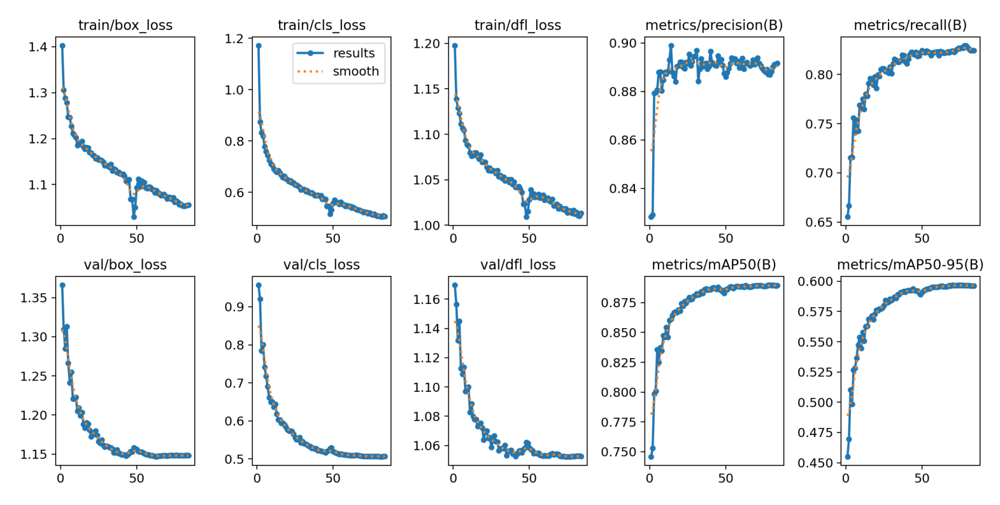

In [ ]:
result_img = plt.imread('/content/drive/MyDrive/YOLOv8_Checkpoints/face_detection2/results.png')
plt.figure(figsize=(20, 20))
plt.imshow(result_img)
plt.axis('off')
plt.show()

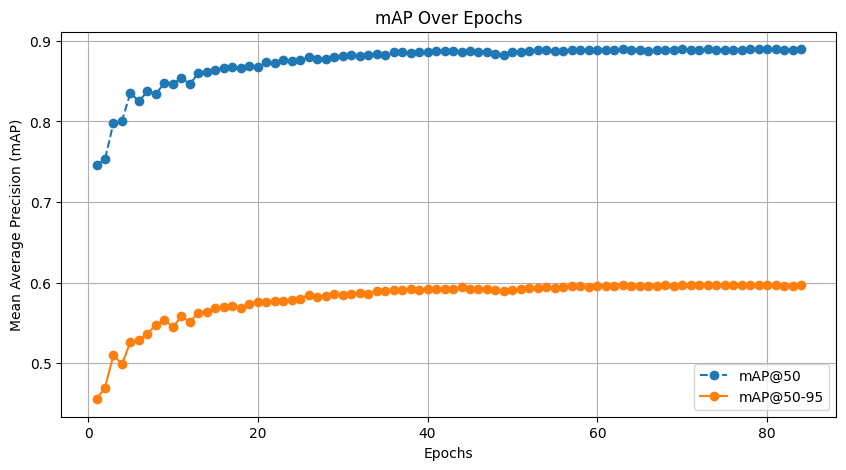

In [ ]:
mAP50_col = "metrics/mAP50(B)"
mAP5095_col = "metrics/mAP50-95(B)"

# Plot mAP over epochs
plt.figure(figsize=(10, 5))
plt.plot(df["epoch"], df[mAP50_col], label="mAP@50", linestyle="--", marker="o")
plt.plot(df["epoch"], df[mAP5095_col], label="mAP@50-95", linestyle="-", marker="o")

plt.xlabel("Epochs")
plt.ylabel("Mean Average Precision (mAP)")
plt.title("mAP Over Epochs")
plt.legend()
plt.grid()
plt.show()

## Evaluating Best Model

In [ ]:
# Apply best model on validation set
best_model_path = "/content/drive/MyDrive/YOLOv8_Checkpoints/face_detection2/weights/best.pt"
model = YOLO(best_model_path)

results = model.val()

print(f"✅ mAP@50: {results.box.map50:.3f}")
print(f"✅ mAP@50-95: {results.box.map:.3f}")

Ultralytics 8.3.76 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


100%|██████████| 755k/755k [00:00<00:00, 19.4MB/s]
val: Scanning /content/drive/MyDrive/YOLOv8_Dataset/face-detection-dataset/versions/3/labels/val.cache... 3347 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3347/3347 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 210/210 [03:43<00:00,  1.06s/it]


                   all       3347      10299       0.89      0.826      0.889      0.597
Speed: 0.3ms preprocess, 3.8ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to runs/detect/val
✅ mAP@50: 0.889
✅ mAP@50-95: 0.597


In [ ]:
precision = results.results_dict["metrics/precision(B)"]
recall = results.results_dict["metrics/recall(B)"]
map50 = results.results_dict["metrics/mAP50(B)"]
map50_95 = results.results_dict["metrics/mAP50-95(B)"]
fitness = results.results_dict["fitness"]

# Print extracted metrics
print("📊 Best Model Evaluation Metrics:")
print(f"🔹 Precision: {precision:.3f}")
print(f"🔹 Recall: {recall:.3f}")
print(f"🔹 mAP@50: {map50:.3f}")
print(f"🔹 mAP@50-95: {map50_95:.3f}")
print(f"🔹 Fitness Score: {fitness:.3f}")


📊 Best Model Evaluation Metrics:
🔹 Precision: 0.890
🔹 Recall: 0.826
🔹 mAP@50: 0.889
🔹 mAP@50-95: 0.597
🔹 Fitness Score: 0.626


In [ ]:
# Save best model results to local drive
import shutil

source_dir = "/content/runs/detect/val"
destination_dir = "/content/drive/MyDrive/YOLOv8_Checkpoints/face_detection2/best_model_results"

os.makedirs(destination_dir, exist_ok=True)

# Copy all files and folders from /runs/detect/val/ to Google Drive
for file_name in os.listdir(source_dir):
    src_path = os.path.join(source_dir, file_name)
    dst_path = os.path.join(destination_dir, file_name)
    shutil.move(src_path, dst_path)  # Move files

print(f"✅ All validation results saved to: {destination_dir}")

✅ All validation results saved to: /content/drive/MyDrive/YOLOv8_Checkpoints/face_detection2/best_model_results


Image with truth labels (correct bounding boxes) 



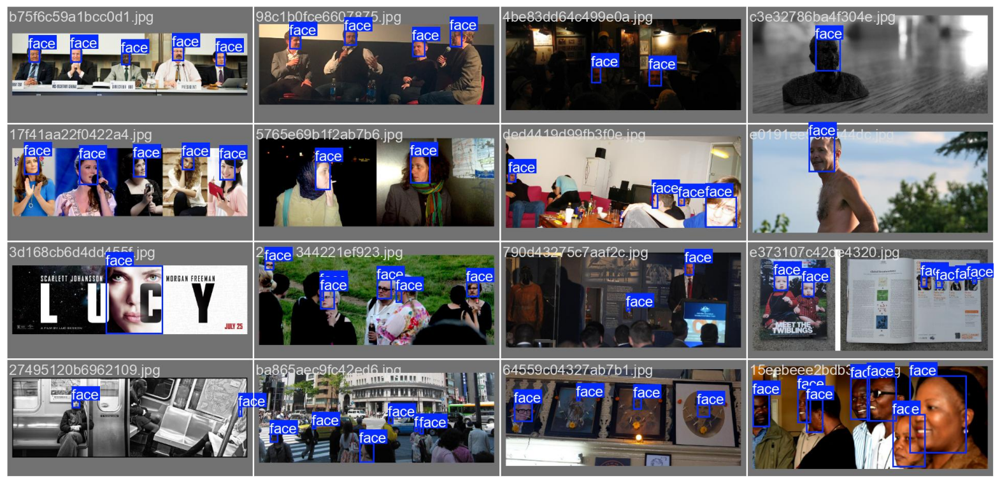


 

Image with model's predicted bounding boxes 



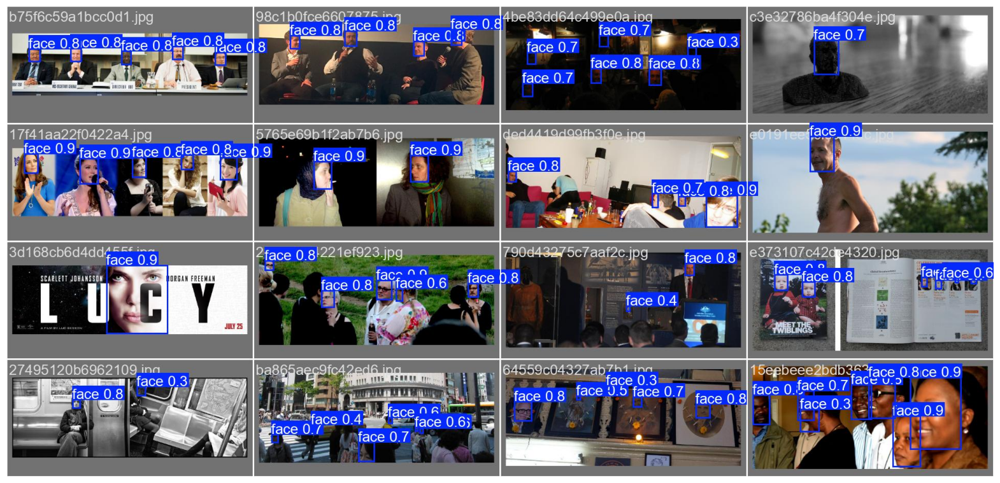

In [ ]:
label0_img = plt.imread('/content/drive/MyDrive/YOLOv8_Checkpoints/face_detection2/best_model_results/val_batch0_labels.jpg')

pred0_img = plt.imread('/content/drive/MyDrive/YOLOv8_Checkpoints/face_detection2/best_model_results/val_batch0_pred.jpg')


print("Image with truth labels (correct bounding boxes) \n")

plt.figure(figsize=(20, 20))
plt.imshow(label0_img)
plt.axis('off')
plt.show()

print('\n \n')
print("Image with model's predicted bounding boxes \n")

plt.figure(figsize=(20, 20))
plt.imshow(pred0_img)
plt.axis('off')
plt.show()


Image with truth labels (correct bounding boxes) 



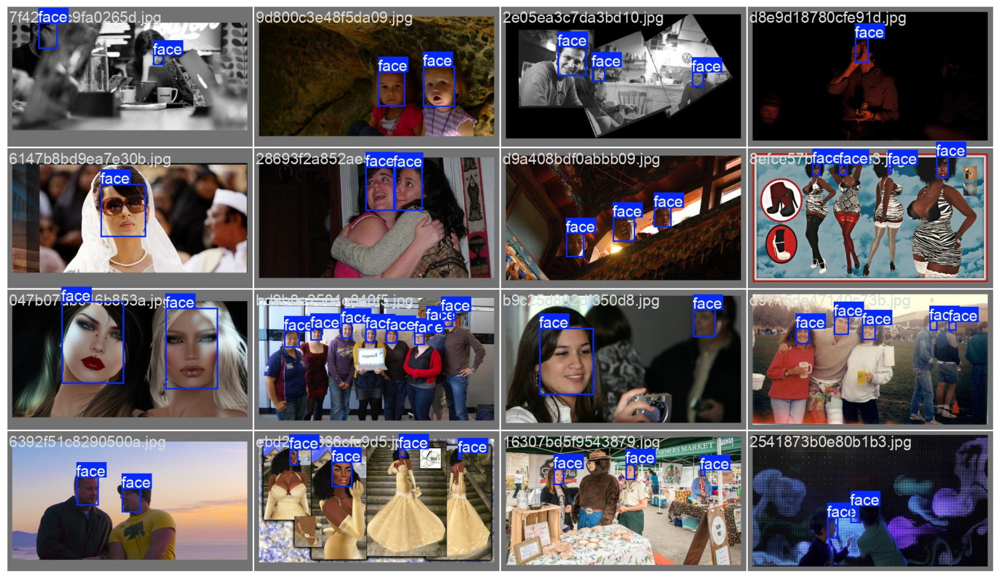


 

Image with model's predicted bounding boxes 



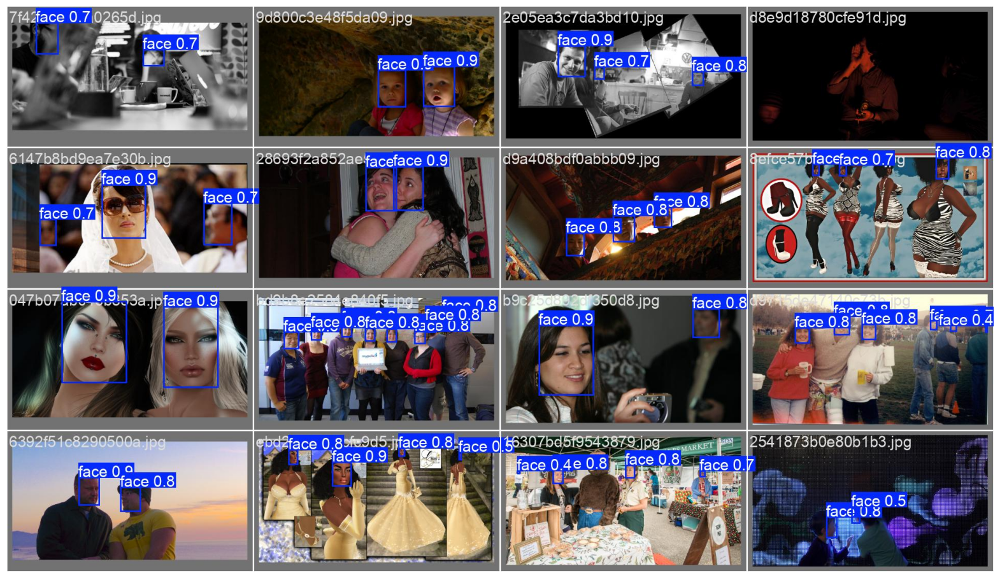

In [ ]:
label1_img = plt.imread('/content/drive/MyDrive/YOLOv8_Checkpoints/face_detection2/best_model_results/val_batch1_labels.jpg')

pred1_img = plt.imread('/content/drive/MyDrive/YOLOv8_Checkpoints/face_detection2/best_model_results/val_batch1_pred.jpg')


print("Image with truth labels (correct bounding boxes) \n")

plt.figure(figsize=(20, 20))
plt.imshow(label1_img)
plt.axis('off')
plt.show()

print('\n \n')
print("Image with model's predicted bounding boxes \n")

plt.figure(figsize=(20, 20))
plt.imshow(pred1_img)
plt.axis('off')
plt.show()

Image with truth labels (correct bounding boxes) 



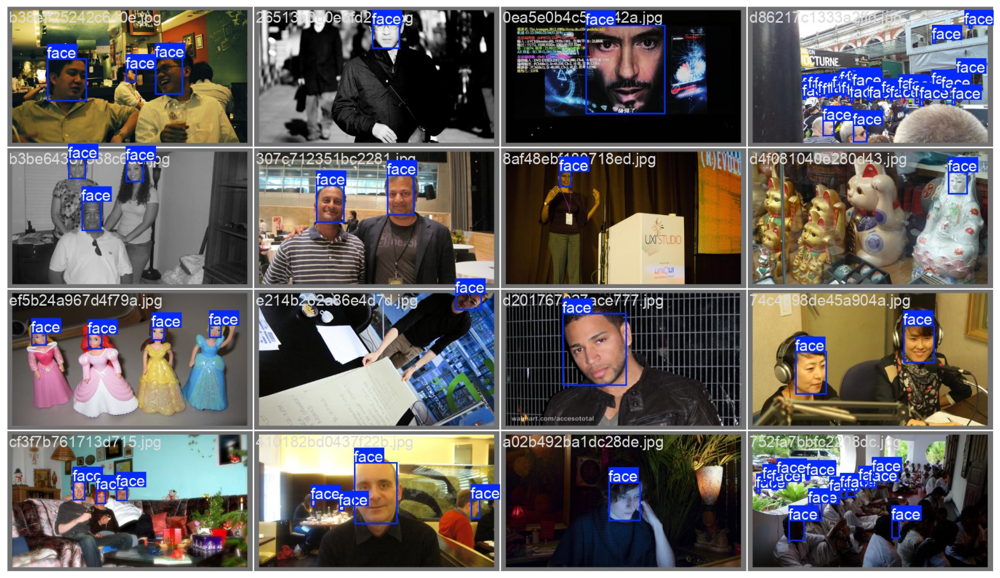


 

Image with model's predicted bounding boxes 



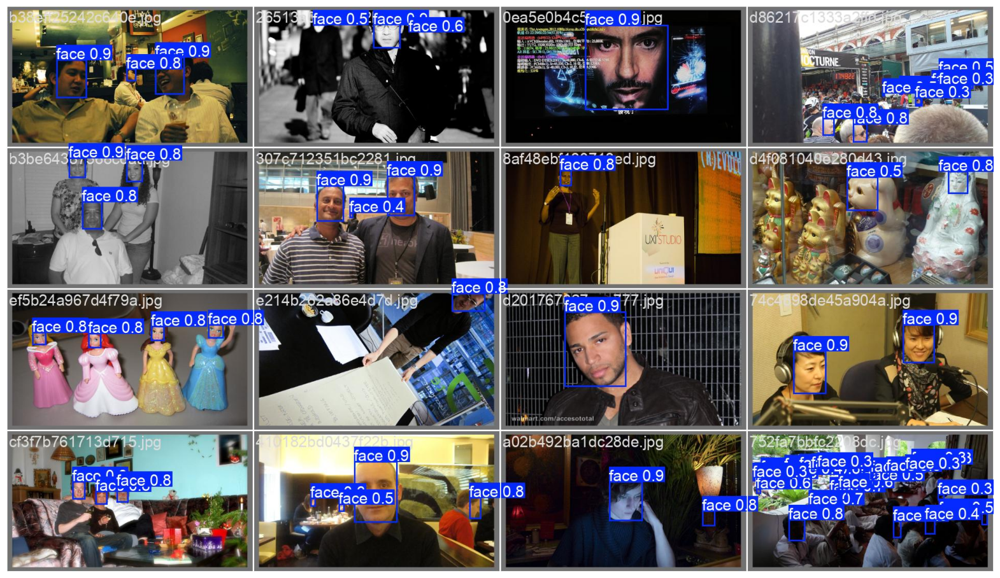

In [ ]:
label2_img = plt.imread('/content/drive/MyDrive/YOLOv8_Checkpoints/face_detection2/best_model_results/val_batch2_labels.jpg')

pred2_img = plt.imread('/content/drive/MyDrive/YOLOv8_Checkpoints/face_detection2/best_model_results/val_batch2_pred.jpg')


print("Image with truth labels (correct bounding boxes) \n")

plt.figure(figsize=(20, 20))
plt.imshow(label2_img)
plt.axis('off')
plt.show()

print('\n \n')
print("Image with model's predicted bounding boxes \n")

plt.figure(figsize=(20, 20))
plt.imshow(pred2_img)
plt.axis('off')
plt.show()

In [ ]:
metrics_dir = "/content/drive/MyDrive/YOLOv8_Checkpoints/face_detection2/best_model_results"

metrics_files = sorted(os.listdir(metrics_dir))

# Filter for specific metric images
f1_curve = os.path.join(metrics_dir, "F1_curve.png")
pr_curve = os.path.join(metrics_dir, "PR_curve.png")
p_curve = os.path.join(metrics_dir, "P_curve.png")
r_curve = os.path.join(metrics_dir, "R_curve.png")
conf_matrix = os.path.join(metrics_dir, "confusion_matrix.png")
conf_matrix_norm = os.path.join(metrics_dir, "confusion_matrix_normalized.png")

def display_metric_image(image_path, title):
    """Displays a YOLOv8 metric image."""
    if os.path.exists(image_path):
        img = Image.open(image_path)
        plt.figure(figsize=(16, 12))
        plt.imshow(img)
        plt.title(title, fontsize=14)
        plt.axis("off")
        plt.show()

def plot_combined_metrics():
    fig, axes = plt.subplots(2, 2, figsize=(12, 10))
    fig.suptitle("YOLOv8 Training Metrics", fontsize=16)

    metric_images = [("F1 Score Curve", f1_curve),
                     ("Precision-Recall Curve", pr_curve),
                     ("Precision Curve", p_curve),
                     ("Recall Curve", r_curve)]

    for ax, (title, path) in zip(axes.flat, metric_images):
        if os.path.exists(path):
            img = Image.open(path)
            ax.imshow(img)
            ax.set_title(title, fontsize=12)
            ax.axis("off")
        else:
            ax.set_title(f"{title} (Not Found)", fontsize=12)
            ax.axis("off")

    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout
    plt.show()



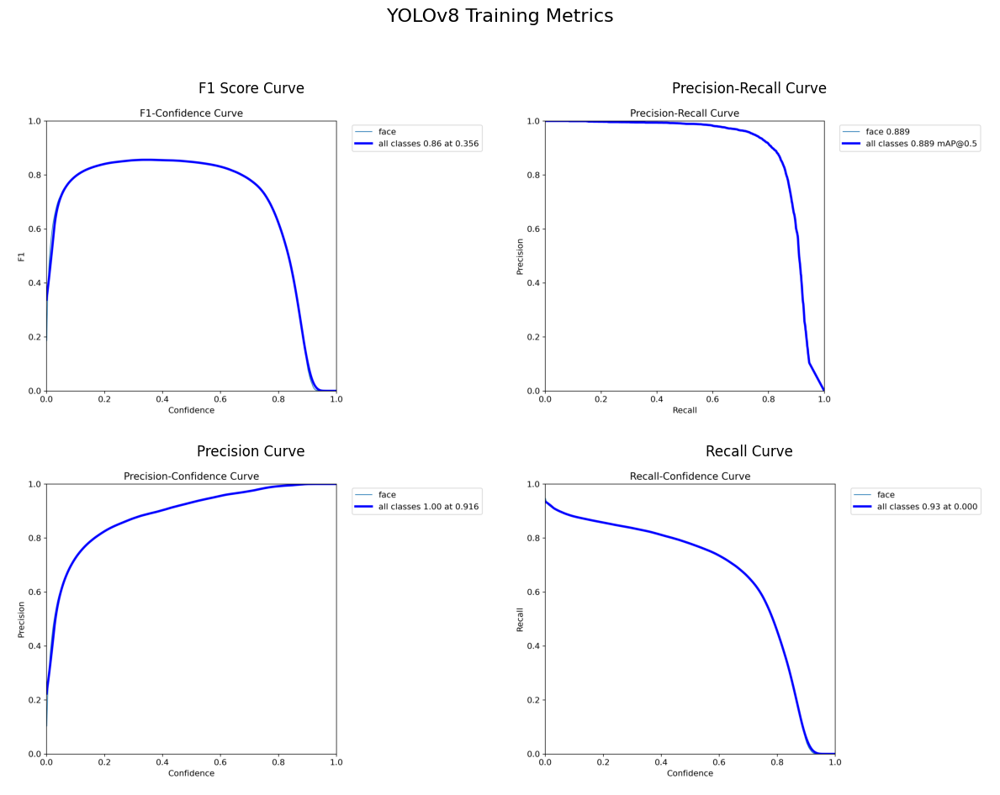

In [ ]:
plot_combined_metrics()

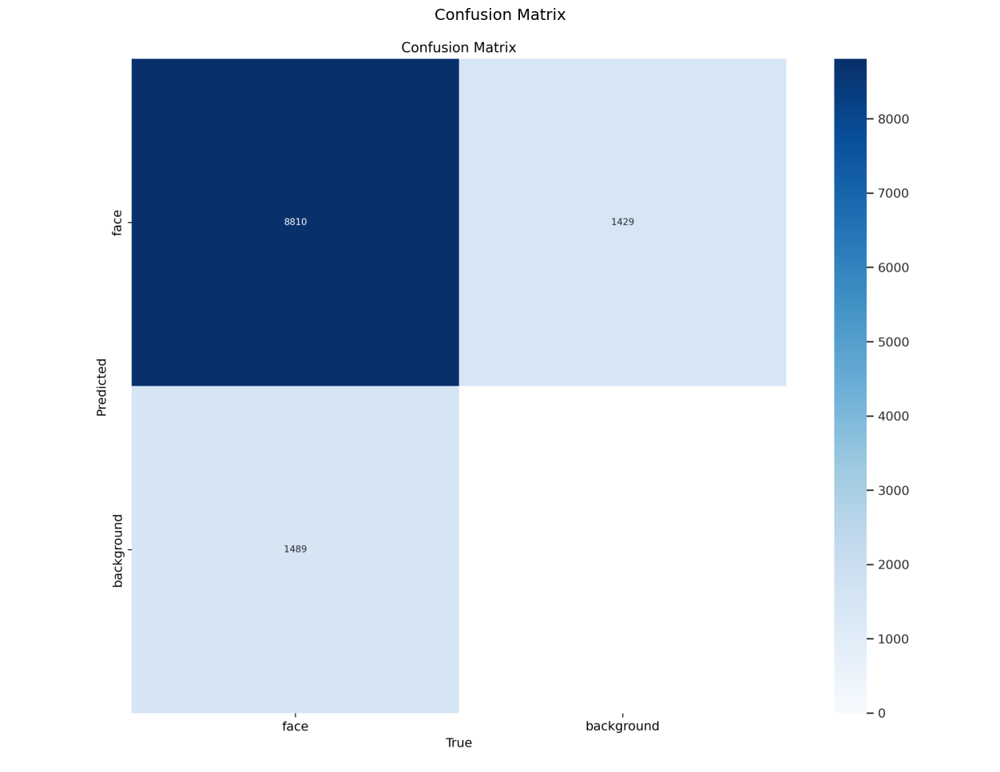

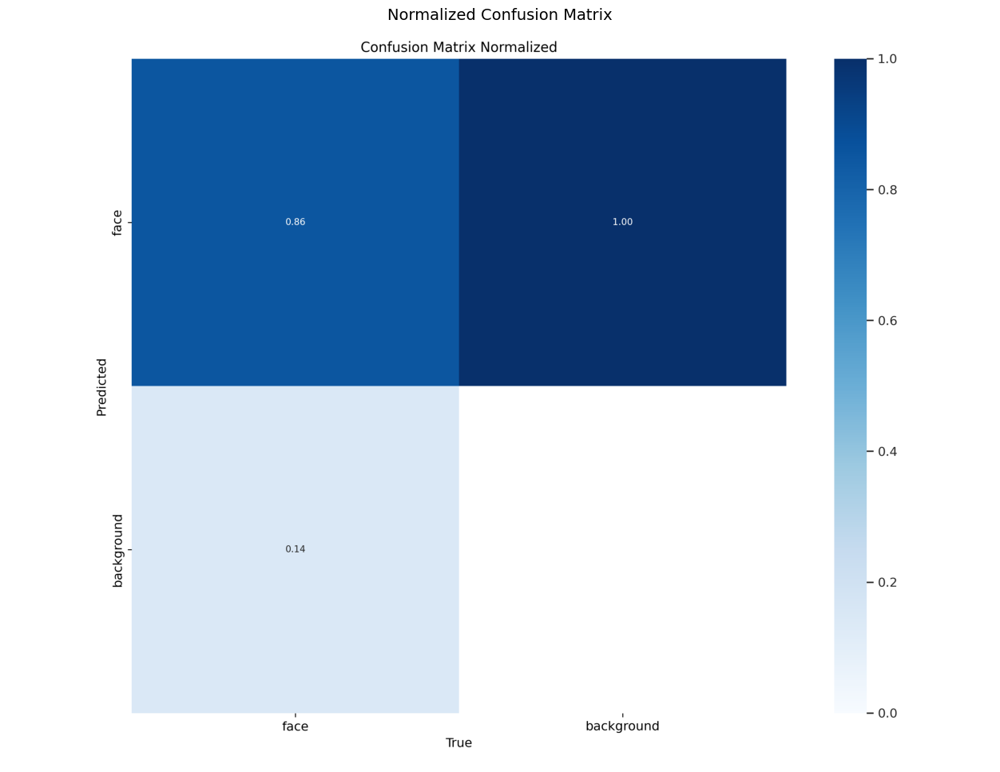

In [ ]:
display_metric_image(conf_matrix, "Confusion Matrix")
display_metric_image(conf_matrix_norm, "Normalized Confusion Matrix")